In [49]:
import pystac_client
from odc import stac as odc_stac
from dask.distributed import wait
from dask.distributed import Client, wait
import os
import xarray as xr
import pyproj
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import numpy as np
import rioxarray
import hvplot.xarray
from rasterio.enums import Resampling
import geopandas as gpd
from rasterio import features
from shapely.geometry import shape


### Load the data

In [2]:
# set up dask client for paralelized computation
client = Client(processes=False, threads_per_worker=2, n_workers=3, memory_limit="12GB")

# Connect to STAC catalog
eodc_catalog = pystac_client.Client.open("https://stac.eodc.eu/api/v1/")

In [3]:
# we define the time range of the event and coordinates of the area with the bounding_box
time_range = "2018-02-28/2018-02-28"
minlon, maxlon = 22.0, 22.8  
minlat, maxlat = 39.45, 39.75

bounding_box = [minlon, minlat, maxlon, maxlat]

In [4]:
# inside the EODC catalogue we get the GFM collection (Global Flood Monitoring) https://services.eodc.eu/browser/#/v1/collections/GFM?.language=en
search = eodc_catalog.search(collections="GFM", bbox=bounding_box, datetime=time_range)
items_GFM = search.item_collection()

items_GFM[0].properties

{'gsd': 20,
 'created': '2024-10-29T13:09:01.227757+00:00',
 'datetime': '2018-02-28T16:32:02Z',
 'Equi7Tile': 'EU020M_E054N006T3',
 'blocksize': {'x': 512, 'y': 512},
 'proj:bbox': [5400000, 600000, 5700000, 900000],
 'proj:wkt2': 'PROJCS["Azimuthal_Equidistant",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433],AUTHORITY["EPSG","4326"]],PROJECTION["Azimuthal_Equidistant"],PARAMETER["latitude_of_center",53],PARAMETER["longitude_of_center",24],PARAMETER["false_easting",5837287.81977],PARAMETER["false_northing",2121415.69617],UNIT["metre",1,AUTHORITY["EPSG","9001"]]]',
 'proj:shape': [15000, 15000],
 'constellation': 'sentinel-1',
 'flood_members': {'DLR': True, 'TUW': True, 'LIST': True},
 'proj:geometry': {'type': 'Polygon',
  'coordinates': [[[5400000.0, 600000.0],
    [5400000.0, 900000.0],
    [5700000.0, 900000.0],
    [5700000.0, 600000.0],
    [540000

In [5]:
crs = pyproj.CRS.from_wkt(items_GFM[0].properties["proj:wkt2"])

# Set the resolution of the data
resolution = items_GFM[0].properties['gsd']

GFM_dc= odc_stac.load(
    items_GFM, 
    bbox=bounding_box,   # Define the bounding box for the area of interest
    crs=crs,   # Set the coordinate reference system
    #bands=["tuw_likelihood","tuw_flood_extent"],   # Specify the bands to load, comment to load all bands
    resolution=resolution,   # Set the resolution of the data
    dtype='uint8',   # Define the data type
    chunks={"x": 1000, "y": 1000, "time": -1},  # Set the chunk size for Dask
)

GFM_dc = GFM_dc.persist()
wait(GFM_dc)

GFM_dc

<xarray.Dataset> Size: 438MB
Dimensions:                (y: 1739, x: 3500, time: 6)
Coordinates:
  * y                      (y) float64 14kB 6.508e+05 6.508e+05 ... 6.161e+05
  * x                      (x) float64 28kB 5.664e+06 5.664e+06 ... 5.734e+06
  * time                   (time) datetime64[ns] 48B 2018-02-28T04:38:43 ... ...
    spatial_ref            int32 4B 27704
Data variables:
    advisory_flags         (time, y, x) uint8 37MB dask.array<chunksize=(6, 1000, 1000), meta=np.ndarray>
    dlr_likelihood         (time, y, x) uint8 37MB dask.array<chunksize=(6, 1000, 1000), meta=np.ndarray>
    exclusion_mask         (time, y, x) uint8 37MB dask.array<chunksize=(6, 1000, 1000), meta=np.ndarray>
    tuw_likelihood         (time, y, x) uint8 37MB dask.array<chunksize=(6, 1000, 1000), meta=np.ndarray>
    list_likelihood        (time, y, x) uint8 37MB dask.array<chunksize=(6, 1000, 1000), meta=np.ndarray>
    dlr_flood_extent       (time, y, x) uint8 37MB dask.array<chunksize=(6, 1000, 1000), meta=np.ndarray>
    tuw_flood_extent       (time, y, x) uint8 37MB dask.array<chunksize=(6, 1000, 1000), meta=np.ndarray>
    list_flood_extent      (time, y, x) uint8 37MB dask.array<chunksize=(6, 1000, 1000), meta=np.ndarray>
    ensemble_likelihood    (time, y, x) uint8 37MB dask.array<chunksize=(6, 1000, 1000), meta=np.ndarray>
    reference_water_mask   (time, y, x) uint8 37MB dask.array<chunksize=(6, 1000, 1000), meta=np.ndarray>
    ensemble_flood_extent  (time, y, x) uint8 37MB dask.array<chunksize=(6, 1000, 1000), meta=np.ndarray>
    ensemble_water_extent  (time, y, x) uint8 37MB dask.array<chunksize=(6, 1000, 1000), meta=np.ndarray>

In [6]:
# Pre-processing
# Substitute 255 for NaNs
GFM_dc["tuw_flood_extent"] = GFM_dc.tuw_flood_extent.where(GFM_dc.tuw_flood_extent!=255).compute()
GFM_dc["tuw_likelihood"] = GFM_dc.tuw_likelihood.where(GFM_dc.tuw_likelihood!=255).compute()
GFM_dc["reference_water_mask"] = GFM_dc.reference_water_mask.where(GFM_dc.reference_water_mask!=255).compute()
GFM_dc["exclusion_mask"] = GFM_dc.exclusion_mask.where(GFM_dc.exclusion_mask!=255).compute()

In [7]:
cube = GFM_dc

In [8]:
# Access the variables
tuw_likelihood = cube["tuw_likelihood"]
tuw_flood_extent = cube["tuw_flood_extent"]

tuw_likelihood = tuw_likelihood.isel(time=1)
tuw_flood_extent = tuw_flood_extent.isel(time=1)
reference_water_mask = cube["reference_water_mask"].isel(time=1)
exclusion_mask = cube["exclusion_mask"].isel(time=1)


In [9]:
num_flooded = np.sum(tuw_flood_extent.values > 0)
num_total = tuw_flood_extent.size
print(f"Flooded fraction: {num_flooded / num_total:.2%}")

Flooded fraction: 1.56%


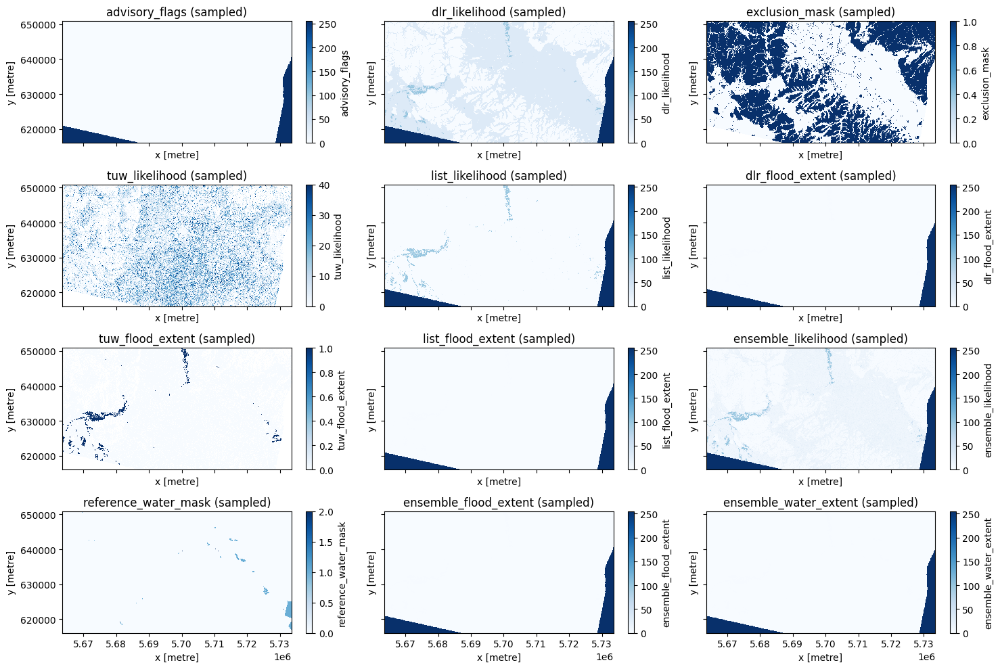

In [10]:
# Option 1: Sample every nth pixel for faster plotting
fig, ax = plt.subplots(4, 3, figsize=(15, 10), sharey=True, sharex=True)
band_names = list(cube.data_vars.keys())  # First 3 bands only

for i, band_name in enumerate(band_names):
    sampled_data = cube[band_name][1, ::4, ::4]
    col = i % 3
    row = i // 3
    sampled_data.plot(ax=ax[row, col], cmap='Blues')
    ax[row, col].set_title(f'{band_name} (sampled)')

plt.tight_layout()
plt.show()

In [11]:
reference_water_mask.hvplot.image(title="Water mask", cmap="Blues", colorbar=True)

:Image   [x,y]   (reference_water_mask)

In [12]:

tuw_likelihood.hvplot.image(title="Flood Likelihood", cmap="Blues", colorbar=True) + \
tuw_flood_extent.hvplot.image(title="Observed Flood Extent", cmap="Reds", colorbar=True)


:Layout
   .Image.I  :Image   [x,y]   (tuw_likelihood)
   .Image.II :Image   [x,y]   (tuw_flood_extent)

In [13]:
da = tuw_flood_extent.copy()  # DO NOT select da.y or da.x

# Step 2: Set spatial dimensions
da = da.rio.set_spatial_dims(x_dim='x', y_dim='y')

In [14]:
ae_crs = (
    "+proj=aeqd +lat_0=53 +lon_0=24 "
    "+x_0=5837287.81977 +y_0=2121415.69617 "
    "+datum=WGS84 +units=m +no_defs"
)
da = da.rio.write_crs(ae_crs)

# Step 4: Reproject to WGS84 (lon/lat)
da_ll = da.rio.reproject("EPSG:4326")

# Step 5: Clip to your bounding box
minlon, maxlon = 22.0, 22.8
minlat, maxlat = 39.45, 39.75
da_ll_clipped = da_ll.rio.clip_box(minx=minlon, maxx=maxlon, miny=minlat, maxy=maxlat)

 

da_visible = da_ll_clipped.where(da_ll_clipped == 1)
da_visible.hvplot.image(
    x="x", y="y",
    geo=True,
    tiles="OSM",
    cmap=["darkred"],
    alpha=0.75,
    frame_height=450,
    title="Flood Extent on Map",
    colorbar=False
)


:Overlay
   .WMTS.I  :WMTS   [Longitude,Latitude]
   .Image.I :Image   [x,y]   (tuw_flood_extent)

## Smoothing the flood area

In [15]:
flood_mask1 = da_visible  # your DataArray

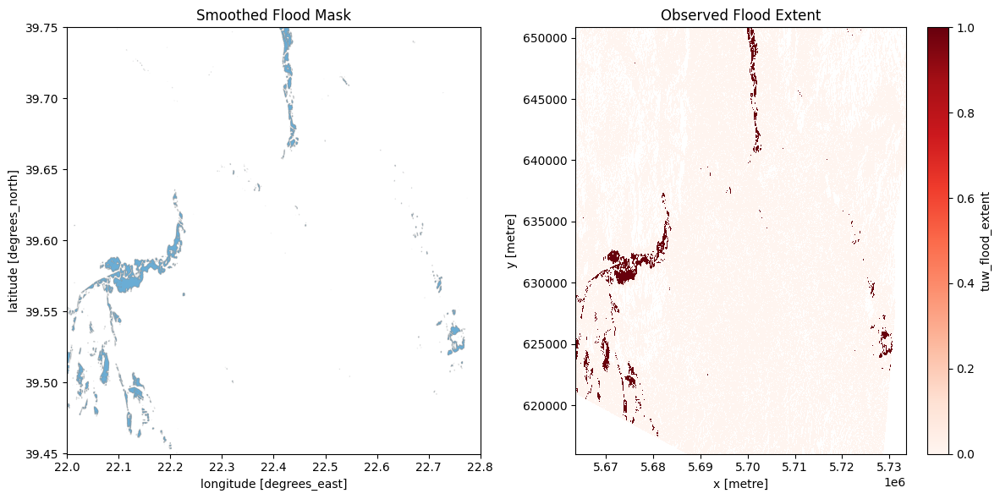

In [41]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))  # 1 row, 2 columns

# Left: smoothed flood mask (blue)
flood_mask1.plot.imshow(
    ax=axes[0],
    interpolation='gaussian',
    cmap='Blues',
    add_colorbar=False,
)
axes[0].set_title("Smoothed Flood Mask")

# Right: observed flood extent (red)
tuw_flood_extent.plot.imshow(
    ax=axes[1],
    cmap='Reds',
    add_colorbar=True,
)
axes[1].set_title("Observed Flood Extent")

plt.tight_layout()
plt.show()


 trying to add base map to matplot

In [96]:
## trying to add base map to matplot
import contextily as ctx
from scipy.ndimage import gaussian_filter


fig, ax = plt.subplots(figsize=(12, 6))

smoothed_3857 = flood_mask1.rio.reproject("EPSG:3857")
ax.set_axis_off()

# Plot the smoothed flood mask in 3857
smoothed_3857.plot.imshow(
    ax=ax,
    cmap="Reds",
    add_colorbar=False,
    add_labels=False 
)

# Add OSM tiles
ctx.add_basemap(ax, crs=smoothed_3857.rio.crs.to_string(),
                    zoom=12,
    alpha=1  )

plt.subplots_adjust(left=0, right=1, top=1, bottom=0)
plt.savefig("basemap_background.png", dpi=150, bbox_inches='tight')
plt.close()

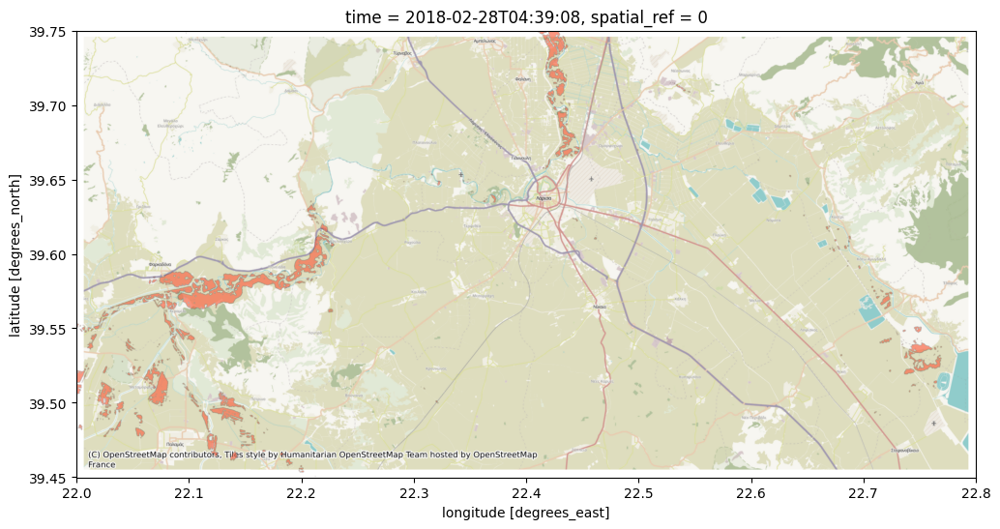

In [97]:
import matplotlib.image as mpimg


# Load the background image
bg = mpimg.imread("basemap_background.png")

fig, ax = plt.subplots(figsize=(12, 6))

# Display background image
ax.imshow(bg, extent=[flood_mask1.x.min(), flood_mask1.x.max(),
                      flood_mask1.y.min(), flood_mask1.y.max()],
          aspect='auto')

# Overlay your flood mask
flood_1 = flood_mask1.copy()
flood_1.plot.imshow(
    ax=ax,
    cmap="Reds",
    alpha=0.7,
    interpolation='gaussian',
    add_colorbar=False
)

plt.show()


In [ ]:
from shapely.geometry import Polygon, MultiPolygon,LinearRing
from shapely.ops import unary_union


## fills all holes in the polygon map
def remove_all_holes(geom):
    if geom.geom_type == "Polygon":
        return Polygon(geom.exterior)  # rebuild without interiors
    elif geom.geom_type == "MultiPolygon":
        return type(geom)([Polygon(p.exterior) for p in geom.geoms])
    else:
        return geom



:Overlay
   .WMTS.I     :WMTS   [Longitude,Latitude]
   .Polygons.I :Polygons   [Longitude,Latitude]

In [ ]:
import geopandas as gpd
from rasterio import features
from shapely.geometry import shape

# Create binary mask for flood extent
mask = (da_visible > 0)

#Convert raster to vector polygons
shapes_gen = features.shapes(
    mask.astype(np.uint8).values,
    mask=~np.isnan(da_visible.values),
    transform=da_visible.rio.transform()
)

#Extract only polygons where mask == 1
polygons = [shape(geom) for geom, val in shapes_gen if val == 1]

#Build GeoDataFrame
gdf = gpd.GeoDataFrame(geometry=polygons, crs=da_visible.rio.crs)

## fill all holes 
#gdf["geometry"] = gdf["geometry"].apply(remove_all_holes)


#Fix invalid geometries and optionally smooth slightly
gdf["geometry"] = gdf.buffer(0)  # repair topology issues
gdf = gdf.explode(ignore_index=True)

#small smooth — tune distance to your CRS
gdf["geometry"] = gdf.buffer(0.0001).buffer(-0.0001)

#plotting
gdf.hvplot.polygons(
    geo=True,
    tiles="OSM",
    color="darkred",
    alpha=0.6,
    frame_height=450,
    title="Flood extent (polygon-smoothed)"
)


C:\Users\jakob\AppData\Local\Temp\ipykernel_4192\1347536076.py:33: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf["geometry"] = gdf.buffer(0.0001).buffer(-0.0001)


:Overlay
   .WMTS.I     :WMTS   [Longitude,Latitude]
   .Polygons.I :Polygons   [Longitude,Latitude]

In [ ]:
## merge polygons after after hole filling

from shapely.ops import unary_union

merged = gdf.unary_union  # merge all geometries
gdf_merged = gpd.GeoDataFrame(geometry=[merged], crs=gdf.crs)


gdf_merged.hvplot.polygons(
    geo=True, tiles="OSM",
    color="darkred", alpha=0.6,
    title="Flood extent (holes filled)"
)


C:\Users\jakob\AppData\Local\Temp\ipykernel_4192\905382880.py:5: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  merged = gdf.unary_union  # merge all geometries


:Overlay
   .WMTS.I     :WMTS   [Longitude,Latitude]
   .Polygons.I :Polygons   [Longitude,Latitude]

In [56]:
### TESTING the same with only filling small holes (under certain size)

# --- 1. Raster to polygons ---
mask = da_visible > 0
shapes_gen = features.shapes(
    mask.astype(np.uint8).values,
    mask=~np.isnan(da_visible.values),
    transform=da_visible.rio.transform()
)

polygons = [shape(geom) for geom, val in shapes_gen if val == 1]
gdf = gpd.GeoDataFrame(geometry=polygons, crs=da_visible.rio.crs)

# --- 2. Ensure projection in meters for area-based filtering ---
gdf = gdf.to_crs("EPSG:3857")

# --- 3. Hole removal function ---
def fill_small_holes(geom, max_hole_area=10000):
    if geom.is_empty:
        return geom
    if geom.geom_type == "Polygon":
        new_interiors = []
        for ring in geom.interiors:
            hole = Polygon(ring)
            if abs(hole.area) > max_hole_area:
                new_interiors.append(ring)
        return Polygon(geom.exterior, new_interiors)
    elif geom.geom_type == "MultiPolygon":
        return MultiPolygon([fill_small_holes(p, max_hole_area) for p in geom.geoms])
    return geom

# --- 4. Fill small holes ---
gdf["geometry"] = gdf["geometry"].apply(lambda g: fill_small_holes(g, max_hole_area=50000))

# --- 5. Clean and repair ---
gdf["geometry"] = gdf.buffer(0)
gdf = gdf.explode(ignore_index=True)
gdf = gdf[~gdf.is_empty & gdf.is_valid]
gdf = gdf.dropna(subset=["geometry"])

# --- 6. Optional smoothing ---
gdf["geometry"] = gdf.buffer(3).buffer(-3)

# --- 7. Reproject back to WGS84 for plotting ---
gdf = gdf.to_crs("EPSG:4326")

# --- 8. Plot ---
gdf.hvplot.polygons(
    geo=True,
    tiles="OSM",
    color="darkred",
    alpha=0.6,
    frame_height=450,
    title="Flood extent (holes <50000 m² filled)"
)


:Overlay
   .WMTS.I     :WMTS   [Longitude,Latitude]
   .Polygons.I :Polygons   [Longitude,Latitude]